# CNNs and Autoencoders

In this project, I'll be exploring the CNN and Autoencoder architectures. I'll start with building a base CNN model and tuning some of the hyperparameters along the way. I'll use it to classify images into different categories of flowers according to it's content. Then, I'll build an Autoencoder and explore what it can do to those same training images.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
from tensorflow import keras
from keras import layers, losses
from keras.models import Sequential, Model
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
import pathlib

In [2]:
dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
data_dir = tf.keras.utils.get_file('flower_photos', origin=dataset_url, untar=True)
data_dir = pathlib.Path(data_dir)

228813984/228813984 [==============================] - 11s 0us/step


In [3]:
#Hyperparameters
batch_size = 32
img_height = 180
img_width = 180

### EDA and Data prep

In [4]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

3670


In [5]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3670 files belonging to 5 classes.
Using 2936 files for training.


In [6]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3670 files belonging to 5 classes.
Using 734 files for validation.


In [7]:
class_names = train_ds.class_names

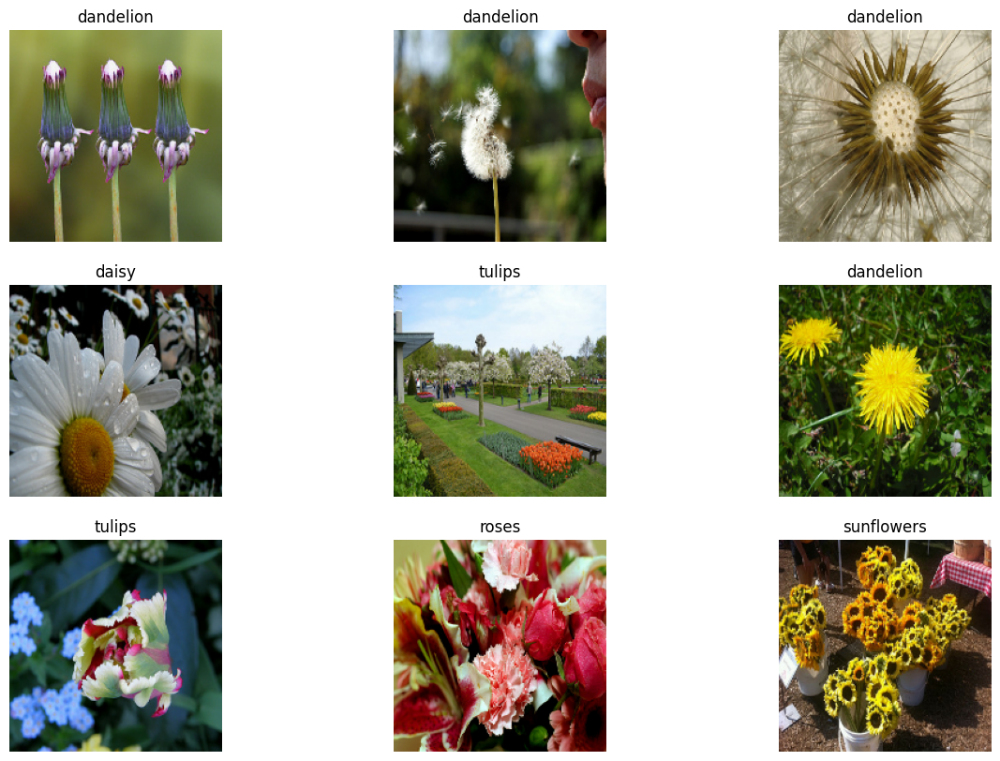

In [59]:
plt.figure(figsize=(15, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [9]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 180, 180, 3)
(32,)


In [10]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [11]:
normalization_layer = layers.Rescaling(1./255)

In [12]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0008662854 0.9806694


### Base Model

In [13]:
#CNN

num_classes = len(class_names)

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [14]:
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 90, 90, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 45, 45, 64)        1

In [15]:
epochs=10
history_1 = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  verbose=0
)

In [18]:
acc = history_1.history['accuracy']
val_acc = history_1.history['val_accuracy']
loss = history_1.history['loss']
val_loss = history_1.history['val_loss']

epochs_range = range(epochs)


In [19]:
def plot_cnn_history(epochs_range, acc, val_acc, loss, val_loss):
    plt.figure(figsize=(15, 4))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()

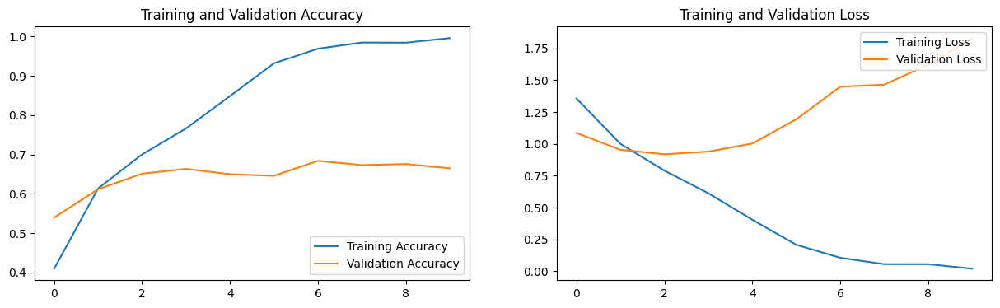

In [20]:
plot_cnn_history(epochs_range,acc, val_acc, loss, val_loss)

### Data augmenting

In [21]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

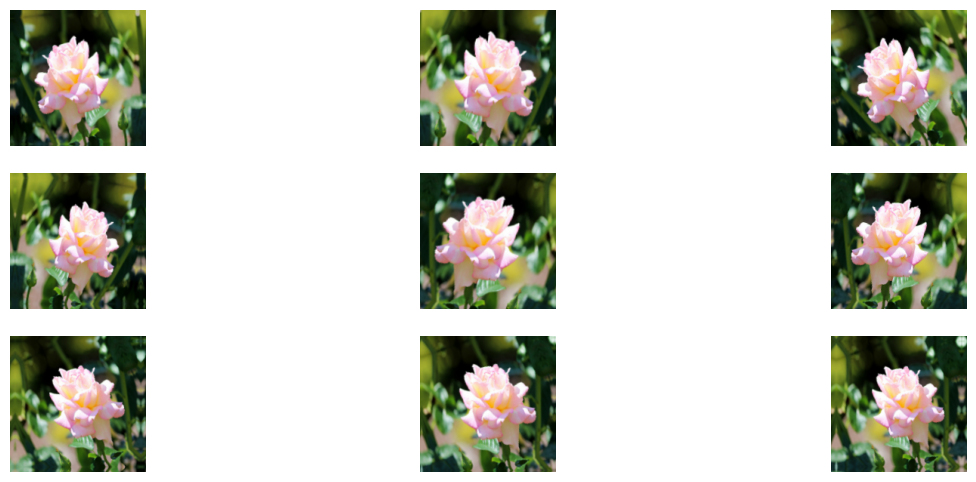

In [23]:
plt.figure(figsize=(15, 6))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

### Hyperparameter tuning

Here, I'm varying the CNN's hyperparameters and other attributes to see how they influence it's performance.

We'll start by using an irrelevant loss function: Mean Squared Error (MSE).

In [24]:
#Model with MSE
#CNN with

num_classes = len(class_names)

model_mse = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])


model_mse.compile(optimizer='adam',
              loss=tf.keras.losses.MeanSquaredError(),
              metrics=['accuracy'])

In [26]:
epochs=10
history_2 = model_mse.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  verbose=0
)

acc = history_2.history['accuracy']
val_acc = history_2.history['val_accuracy']
loss = history_2.history['loss']
val_loss = history_2.history['val_loss']
epochs_range = range(epochs)

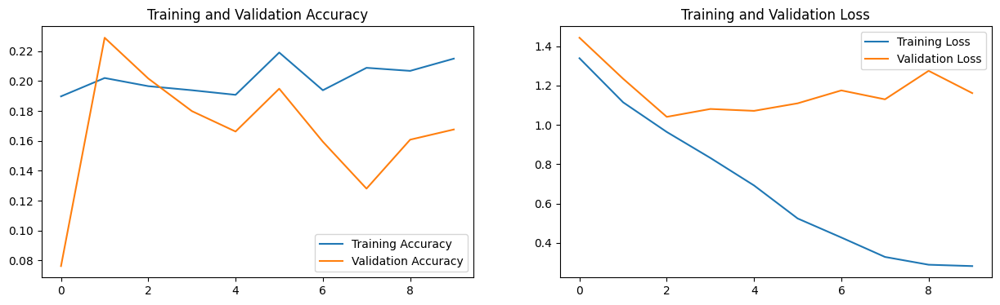

In [27]:
plot_cnn_history(epochs_range,acc, val_acc, loss, val_loss)

Next, we'll introduce dropout - a common technique to increase generalisation of neural networks and make our model more robust.

In [28]:
#Dropout

model_do = Sequential([
  data_augmentation,
  layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.4),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes, name="outputs")
])

model_do.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [29]:
epochs=15
history_3 = model_do.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  verbose=0
)

acc = history_3.history['accuracy']
val_acc = history_3.history['val_accuracy']
loss = history_3.history['loss']
val_loss = history_3.history['val_loss']
epochs_range = range(epochs)

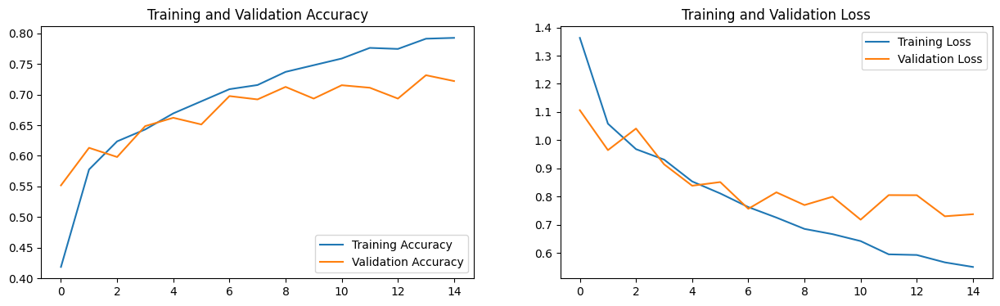

In [30]:
plot_cnn_history(epochs_range,acc, val_acc, loss, val_loss)

Here, we'll drastically reduce the batch size and analyse the effects.

In [31]:
#CNN

#Hyperparameters
batch_size = 8
img_height = 180
img_width = 180

num_classes = len(class_names)

model_b8 = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

model_b8.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [32]:
epochs=15
history_4 = model_b8.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  verbose=0
)

acc = history_4.history['accuracy']
val_acc = history_4.history['val_accuracy']
loss = history_4.history['loss']
val_loss = history_4.history['val_loss']
epochs_range = range(epochs)

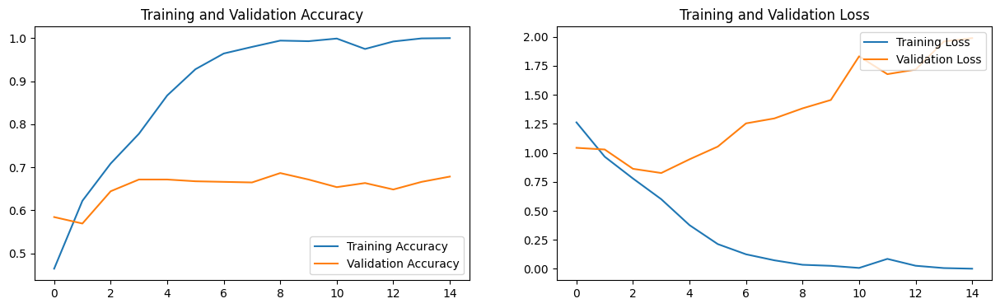

In [33]:
plot_cnn_history(epochs_range,acc, val_acc, loss, val_loss)

Batch Normalization is another powerful regularization technique. Normalizing each individual batch before running it through the network. Again, this help make the model more robust and generalisable.

In [34]:
#CNN
from tensorflow.keras.layers import BatchNormalization

#Hyperparameters
batch_size = 32
img_height = 180
img_width = 180

num_classes = len(class_names)

model_bn = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])


model_bn.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [35]:
epochs=15
history_5 = model_bn.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  verbose=0
)

acc = history_5.history['accuracy']
val_acc = history_5.history['val_accuracy']
loss = history_5.history['loss']
val_loss = history_5.history['val_loss']
epochs_range = range(epochs)

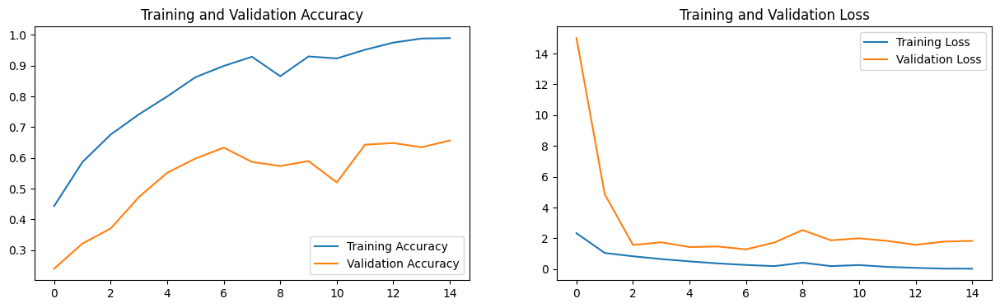

In [36]:
plot_cnn_history(epochs_range,acc, val_acc, loss, val_loss)

Here's a medley where we change multiple parameters relative to the base model.

In [38]:
#Hyperparameters
batch_size = 16
img_height = 180
img_width = 180

num_classes = len(class_names)

model_combo = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Dropout(0.4),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])


model_combo.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [39]:
epochs=15
history_6 = model_combo.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  verbose=0
)

acc = history_6.history['accuracy']
val_acc = history_6.history['val_accuracy']
loss = history_6.history['loss']
val_loss = history_6.history['val_loss']
epochs_range = range(epochs)


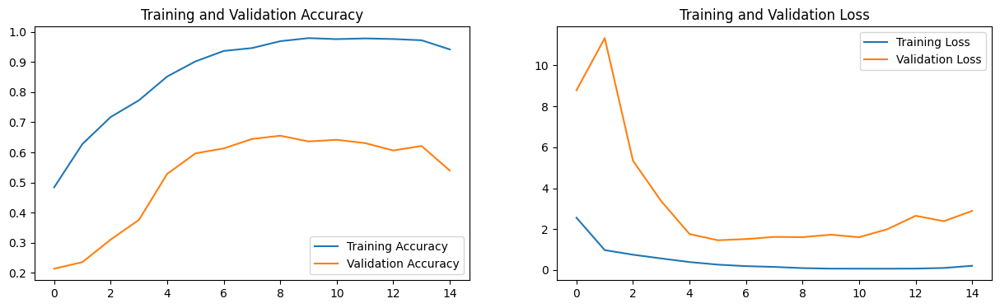

In [40]:
plot_cnn_history(epochs_range, acc, val_acc, loss, val_loss)

## Summary

The base CNN Model overfits to the training data quite easily, with the training loss plummeting while the validation loss increases. We augmented the data to increase the training resources.

The model adjustments had drastic effects on model accuracy and overfitting. The MSE as a loss function resulted in poor performance, as one would expect for image classifciation tasks. Dropout readily improved overfitting and performance in both the training and testing data. Low batch size hindered performance without improving overfitting. Batch Norm barely increased performance, yet did much better than lower batch size in terms of it's impact on overfitting. The combination model didn't perform much better than Batch Norm itself, yet it can be seen as an improvement to the base model.

# Autoencoder

### Data Prep

In [41]:
batch_size = 32
img_height, img_width = 180, 180
total_dims = 180*180*3

In [42]:
#3500 for training
vsplit = (1-3500/image_count)
vsplit

0.0463215258855586

In [43]:
# Split the dataset into training and validation sets
from tensorflow.keras.preprocessing.image import ImageDataGenerator

image_generator = ImageDataGenerator(rescale=1./255, validation_split=vsplit)
img_height, img_width = 180, 180
train_data_gen = image_generator.flow_from_directory(directory=data_dir,
                                                     batch_size=batch_size,
                                                     shuffle=True,
                                                     target_size=(img_height, img_width),
                                                     class_mode='input',
                                                     subset='training')
val_data_gen = image_generator.flow_from_directory(directory=data_dir,
                                                   batch_size=batch_size,
                                                   shuffle=False,
                                                   target_size=(img_height, img_width),
                                                   class_mode='input',
                                                   subset='validation')

Found 3502 images belonging to 5 classes.
Found 168 images belonging to 5 classes.


### Model Construction

In [44]:
class Autoencoder(Model):
    def __init__(self, img_height, img_width):
        super(Autoencoder, self).__init__()
        self.height = img_height
        self.width = img_width

        self.encoder = tf.keras.Sequential([
            layers.Input(shape=(img_height, img_width, 3)),
            layers.Conv2D(16, (3, 3), activation='relu', padding='same', input_shape=(img_height, img_width, 3)),
            layers.MaxPooling2D((2, 2), padding='same'),
            layers.Conv2D(8, (3, 3), activation='relu', padding='same'),
            layers.MaxPooling2D((2, 2), padding='same'),
            layers.Conv2D(8, (3, 3), activation='relu', padding='same'),
            layers.MaxPooling2D((2, 2), padding='same')
        ])

        self.decoder = tf.keras.Sequential([
            layers.Conv2D(8, (3, 3), activation='relu', padding='same', input_shape=(23, 23, 8)),
            layers.UpSampling2D((2, 2)),
            layers.Conv2D(8, (3, 3), activation='relu', padding='same'),
            layers.UpSampling2D((2, 2)),
            layers.Conv2D(16, (3, 3), activation='relu', padding='valid'),
            layers.UpSampling2D((2, 2)),
            layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')
        ])

    def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded



In [48]:
autoencoder = Autoencoder(img_height, img_width)
autoencoder.build((None, img_height, img_width, 3))  # Build the model
autoencoder.compile(optimizer='adam', loss=losses.MeanSquaredError())

In [49]:
autoencoder.summary()

Model: "autoencoder_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_10 (Sequential)  (None, 23, 23, 8)         2192      
                                                                 
 sequential_11 (Sequential)  (None, 180, 180, 3)       2771      
                                                                 
Total params: 4,963
Trainable params: 4,963
Non-trainable params: 0
_________________________________________________________________


### Train Model

In [50]:
# Check if GPU is available and enabled
if tf.test.gpu_device_name():
    print('GPU device found')
    print('Default GPU Device:{}'.format(tf.test.gpu_device_name()))
else:
    print("No GPU found.")


GPU device found
Default GPU Device:/device:GPU:0


In [51]:
with tf.device('/device:GPU:0'):
    epochs = 10
    autoencoder.fit(train_data_gen, batch_size=batch_size, epochs=epochs, validation_data=val_data_gen)


Epoch 1/10
110/110 [==============================] - 17s 116ms/step - loss: 0.0502 - val_loss: 0.0286
Epoch 2/10
110/110 [==============================] - 11s 100ms/step - loss: 0.0223 - val_loss: 0.0231
Epoch 3/10
110/110 [==============================] - 11s 104ms/step - loss: 0.0193 - val_loss: 0.0219
Epoch 4/10
110/110 [==============================] - 11s 100ms/step - loss: 0.0184 - val_loss: 0.0211
Epoch 5/10
110/110 [==============================] - 12s 110ms/step - loss: 0.0176 - val_loss: 0.0201
Epoch 6/10
110/110 [==============================] - 12s 111ms/step - loss: 0.0169 - val_loss: 0.0196
Epoch 7/10
110/110 [==============================] - 12s 111ms/step - loss: 0.0162 - val_loss: 0.0184
Epoch 8/10
110/110 [==============================] - 12s 106ms/step - loss: 0.0148 - val_loss: 0.0170
Epoch 9/10
110/110 [==============================] - 12s 110ms/step - loss: 0.0140 - val_loss: 0.0165
Epoch 10/10
110/110 [==============================] - 12s 107ms/step - l

In [52]:
# Sample 3 images from the training data
train_images = next(train_data_gen)[0][:3]
val_images = next(val_data_gen)[0][:3]

In [53]:
x = np.concatenate((train_images, val_images))

In [54]:
encoded_imgs = autoencoder.encoder(x).numpy()
decoded_imgs = autoencoder.decoder(encoded_imgs).numpy()

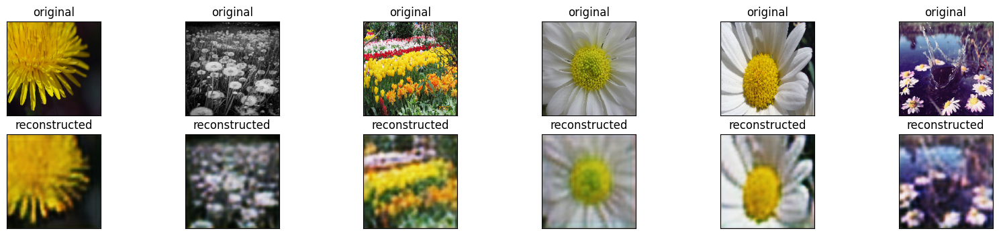

In [55]:
n = len(x)
plt.figure(figsize=(20, 4))
for i in range(n):
  # display original
  ax = plt.subplot(2, n, i + 1)
  plt.imshow(x[i])
  plt.title("original")
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)

  # display reconstruction
  ax = plt.subplot(2, n, i + 1 + n)
  plt.imshow(decoded_imgs[i])
  plt.title("reconstructed")
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
plt.show()

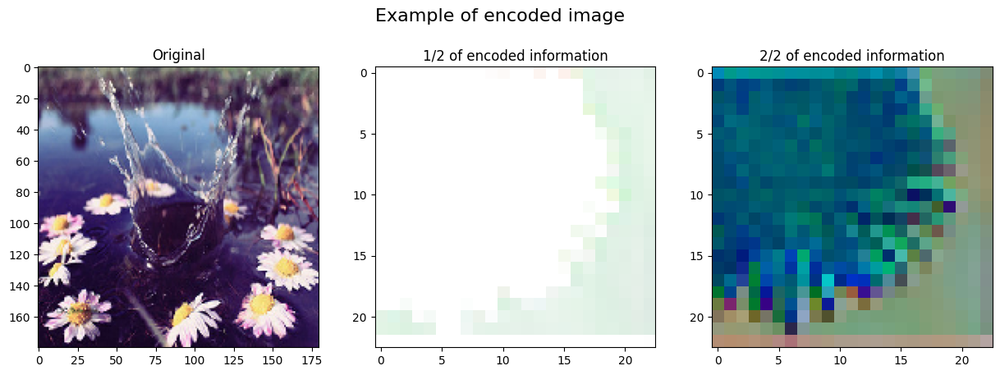

In [56]:
# Split the channels into separate arrays
channels = np.split(encoded_imgs[0], 2, axis=2)

# Display each channel separately
fig, axs = plt.subplots(ncols=3, figsize=(15, 5))
axs[0].imshow(x[i])
axs[0].set_title("Original")
axs[1].imshow(channels[0])
axs[1].set_title("1/2 of encoded information")
axs[2].imshow(channels[1])
axs[2].set_title("2/2 of encoded information")

fig.suptitle("Example of encoded image", fontsize=16)
plt.show()

### Adding Noise

Let's look at the effect of adding some Gaussian Noise into the mix. We'll start by adding noise into the encoded images, and then compare that with adding noise into the input images.

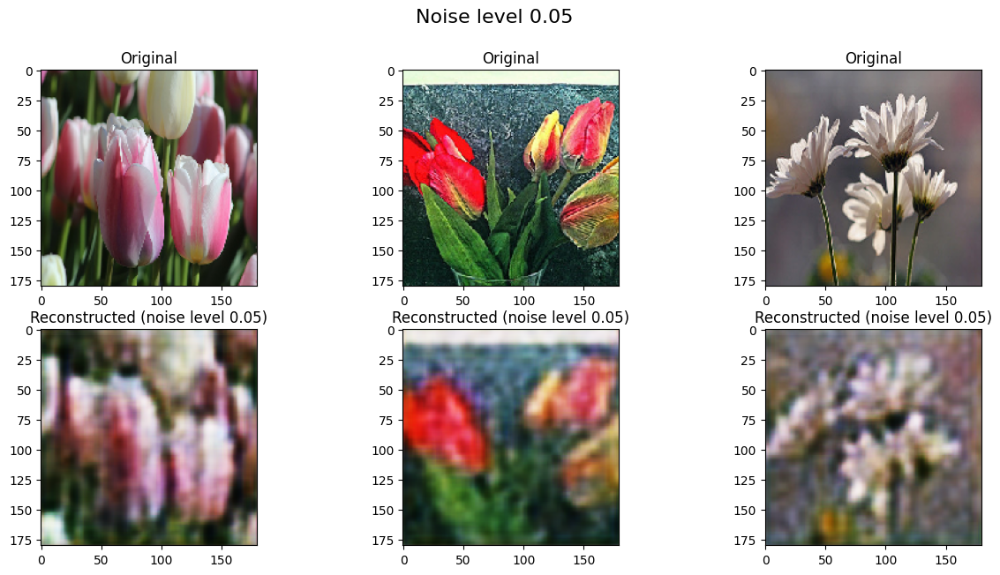

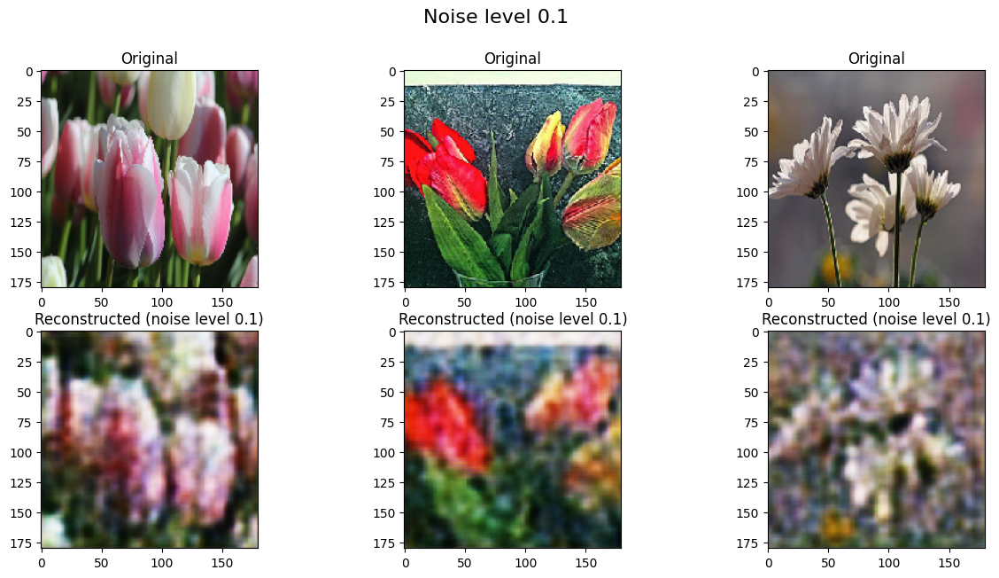

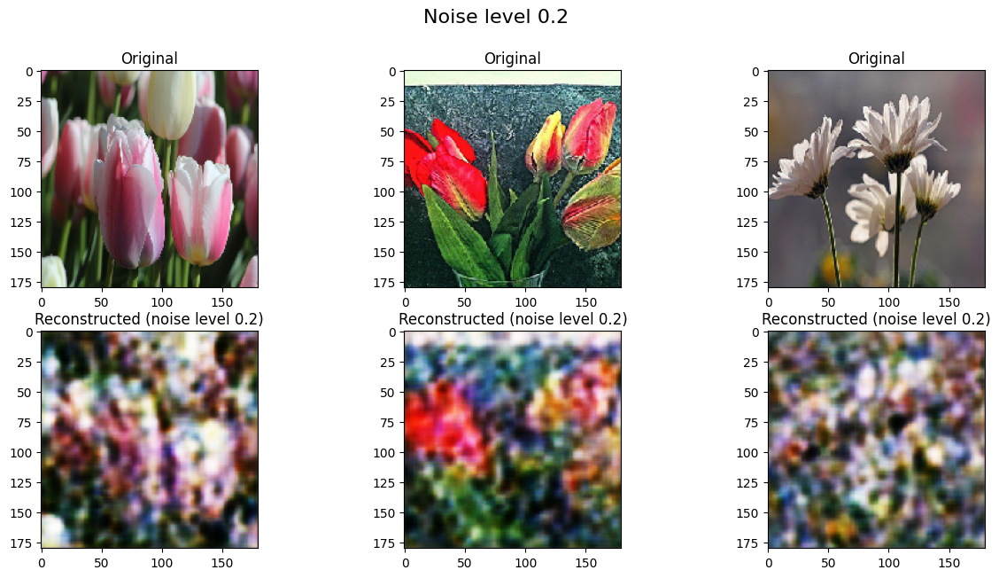

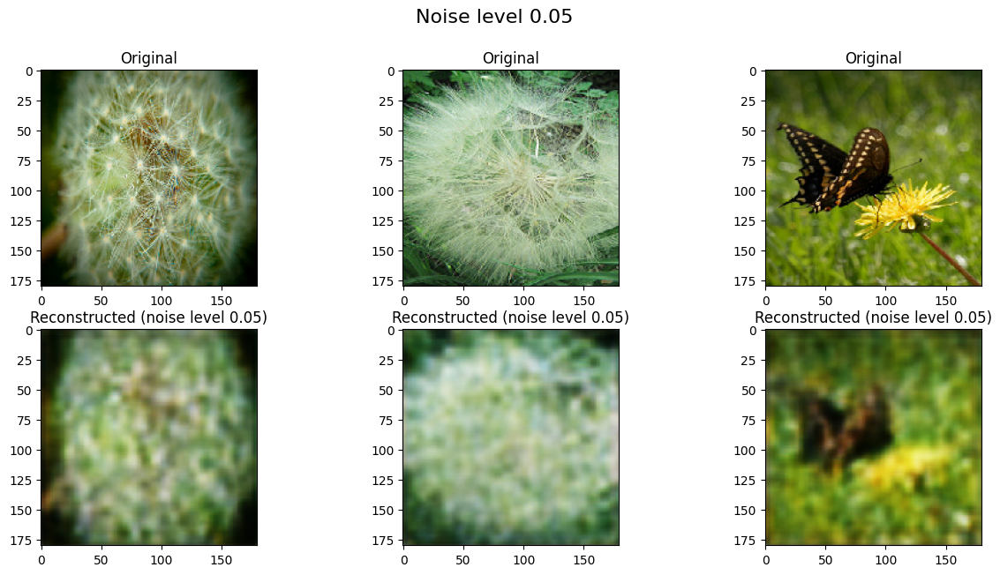

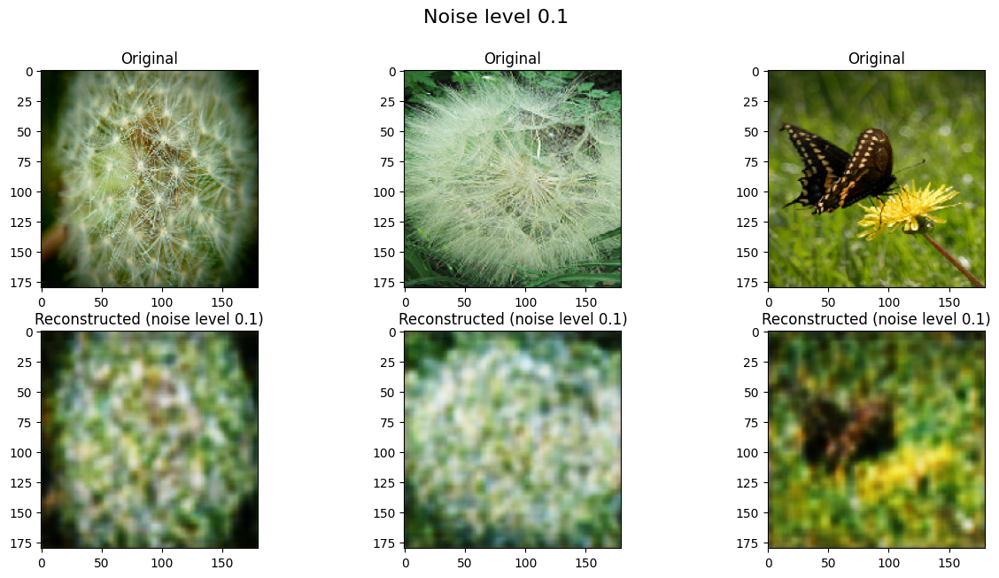

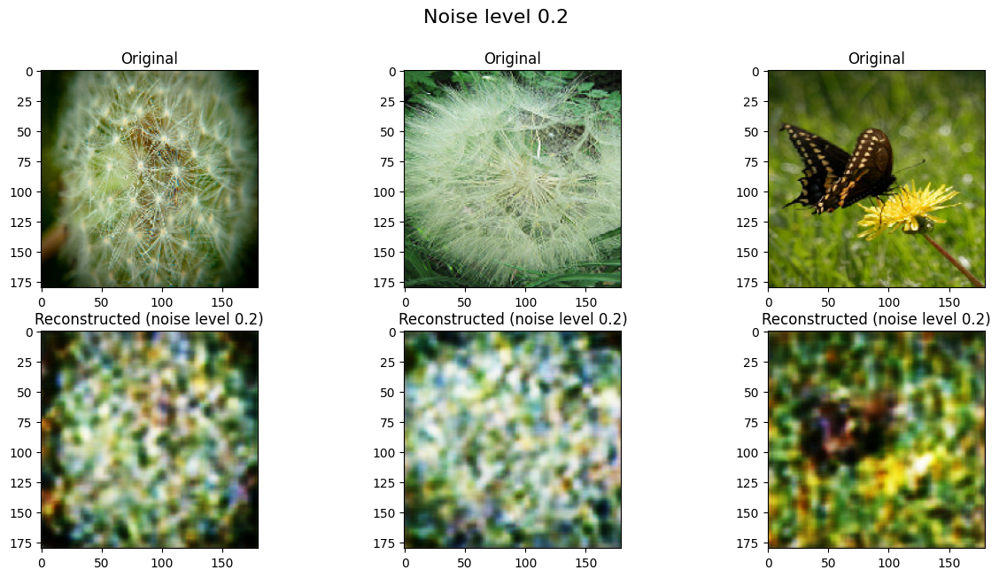

In [57]:
from tensorflow.keras.layers import GaussianNoise
noise_levels = [0.05, 0.1, 0.2]

# Sample 3 examples from each dataset split, apply noise, decode and visualize
for dataset in [train_data_gen, val_data_gen]:
    sample = next(dataset)[0][:3]
    encoded = autoencoder.encoder(sample)

    for noise_level in noise_levels:
        #For GaussianNoise to work the model must be set to training
        noisy_encoded = GaussianNoise(noise_level)(encoded, training=True)
        decoded = autoencoder.decoder(noisy_encoded, training=True)

        # Visualize the original and reconstructed images
        fig, axs = plt.subplots(2, 3, figsize=(15, 7))
        for i in range(3):
            axs[0, i].imshow(sample[i])
            axs[1, i].imshow(decoded[i])
            axs[0, i].set_title('Original')
            axs[1, i].set_title(f'Reconstructed (noise level {noise_level})')
        fig.suptitle(f'Noise level {noise_level}', fontsize=16)
        plt.show()

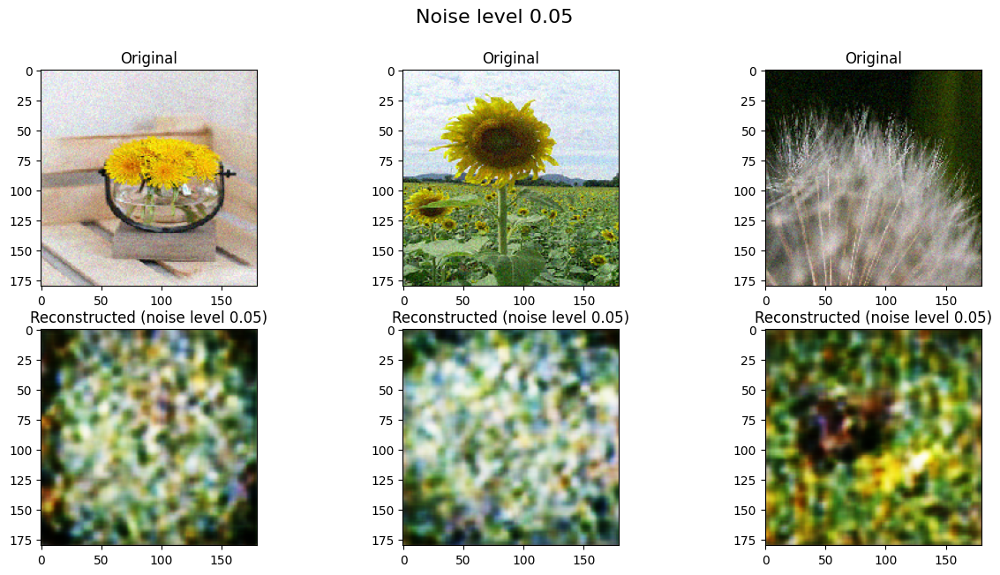

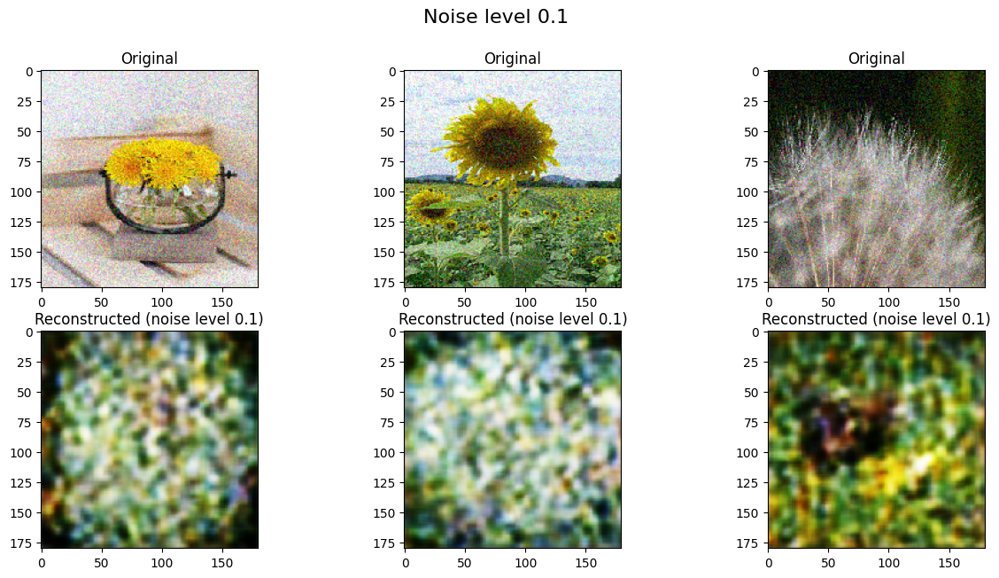

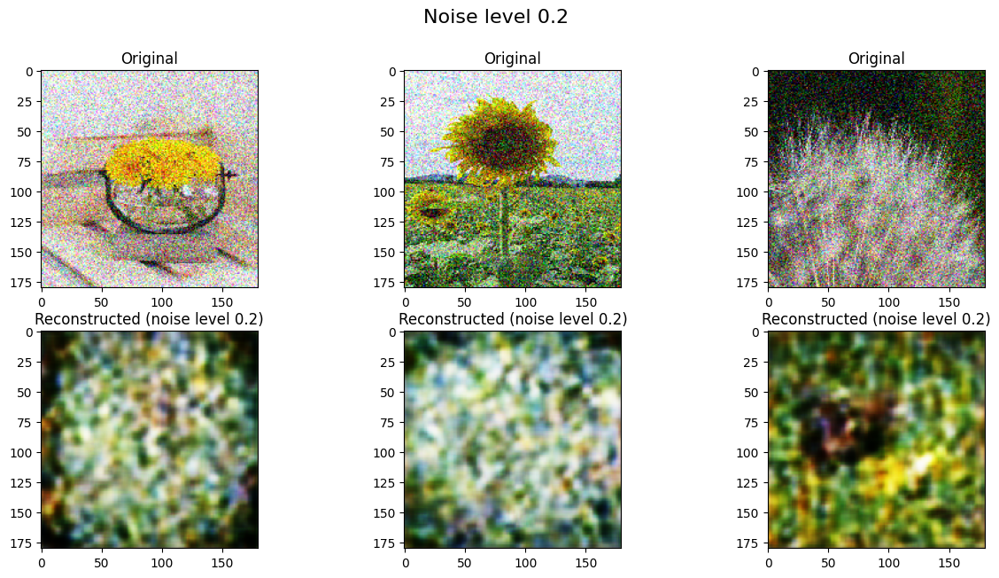

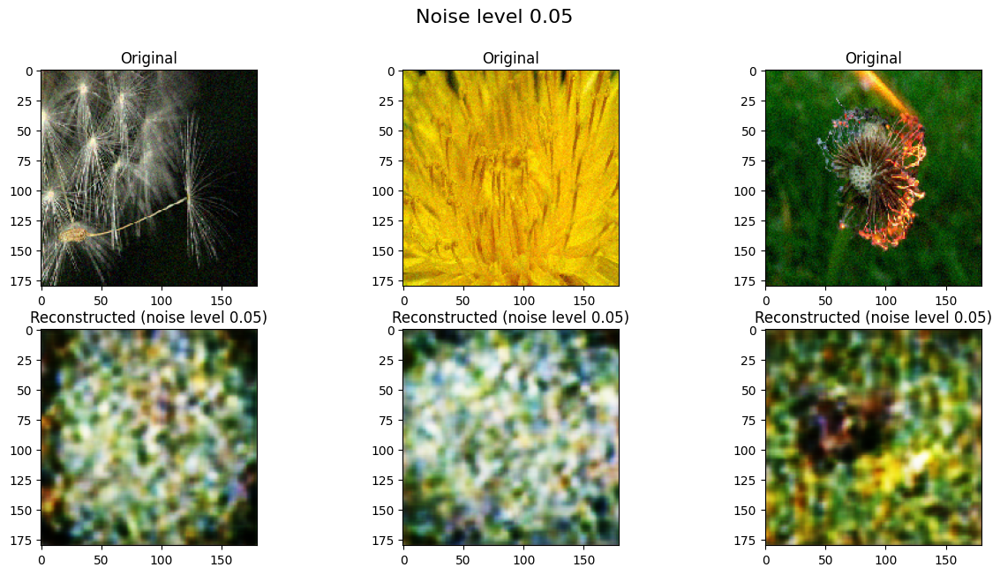

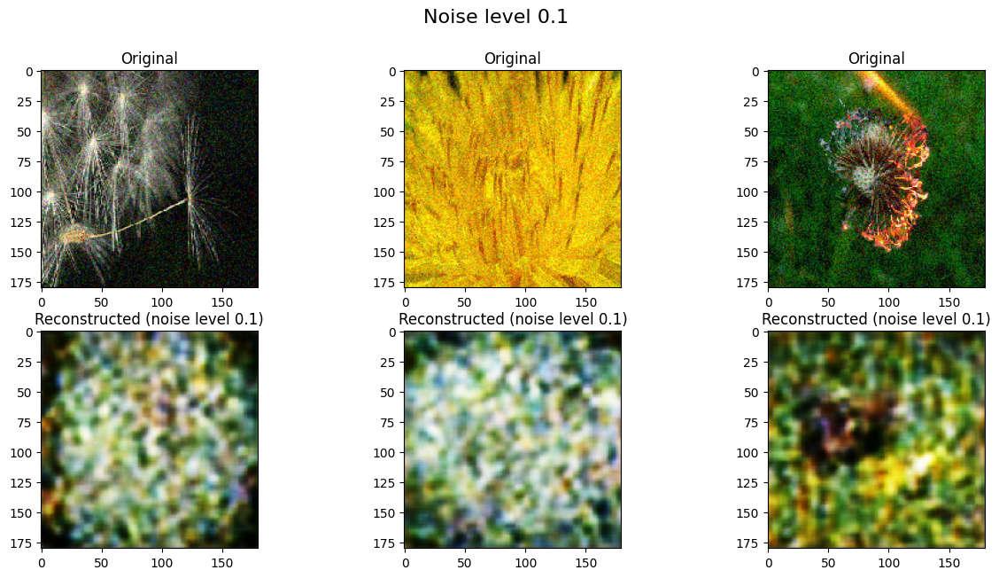

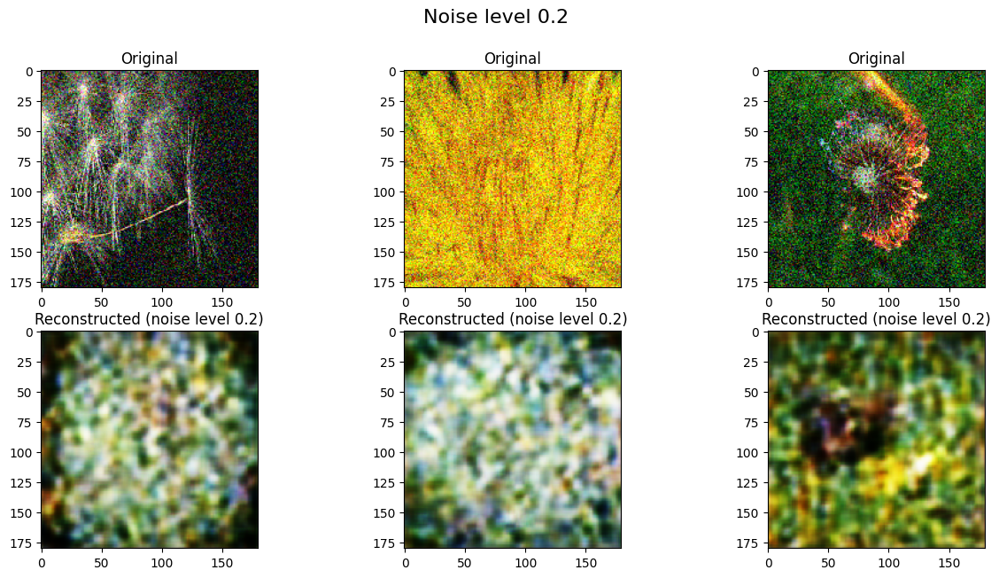

In [58]:
noise_levels = [0.05, 0.1, 0.2]

# Sample 3 examples from each dataset split, apply noise, decode and visualize
for dataset in [train_data_gen, val_data_gen]:
    sample = next(dataset)[0][:3]

    for noise_level in noise_levels:
        sample_encoded = GaussianNoise(noise_level)(sample, training=True)
        #For GaussianNoise to work the model must be set to training
        encoded = autoencoder.encoder(sample_encoded)
        decoded = autoencoder.decoder(noisy_encoded, training=True)

        # Visualize the original and reconstructed images
        fig, axs = plt.subplots(2, 3, figsize=(15, 7))
        for i in range(3):
            axs[0, i].imshow(sample_encoded[i])
            axs[1, i].imshow(decoded[i])
            axs[0, i].set_title('Original')
            axs[1, i].set_title(f'Reconstructed (noise level {noise_level})')
        fig.suptitle(f'Noise level {noise_level}', fontsize=16)
        plt.show()

# Summary

The base Autoencoder model returns a blurred image of the original. The addition of noise to the encoded images blurs the output, but the addition of noise to the input image significantly blurs the output to a far greater extent. Even the 5% noice level added to the sample input results in an unrecognisable output.

Autoencoders are an interesting model architecture that I'm interested in exploring further. They can be used for a wide range of tasks, such as anomaly detection image compression and super-resolution. They are particularly useful for image classification tasks. Moreover, they can be used to generate new images from a trained model.